<a href="https://colab.research.google.com/github/roberto-takada/PDIE8-notebooks/blob/main/FundamentosDeImagemParte1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# R. Takada

## Fundamentos de Imagem

#### Importando bibliotecas

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageFilter
from scipy import ndimage
from scipy.ndimage import uniform_filter, median_filter
import cv2
import os
# Tem um link no arquivo .py para o arquivo no collab
# Criar uma pasta no google collab chamada images e colocar as imagens lá dentro
imageNames = os.listdir('./images')
images = [Image.open('./images/' + img).convert('L') for img in imageNames]

#### Função para plotar ambas as imagens

In [ ]:
def plota(imagem1, imagem2, texto):
    plt.figure(figsize=(10, 10))

    plt1 = plt.subplot(1, 2, 1)
    plt1.imshow(imagem1, cmap='gray')
    plt1.set_title('Original')

    plt2 = plt.subplot(1, 2, 2)
    plt2.imshow(imagem2, cmap='gray')
    plt2.set_title(texto)


### 1. Ponto a Ponto

#### Negativo da Imagem

In [ ]:
def negativo(imagem):
  plota(imagem, 255 - imagem, 'Negativo')

#### Diminuir pela metade a intensidade dos pixels

In [ ]:
def reduz_intensidade(imagem):
  plota(imagem, imagem / 2, 'Reduz Intensidade')

#### Adiciona quatro quadrados nos cantos da imagem

In [ ]:
def adiciona_quadrados(imagem):
  tam_quadrados = 10
  cor_quadrados = 255
  imagem_antiga = np.copy(imagem)
  imagem[:tam_quadrados, :tam_quadrados] = cor_quadrados
  imagem[:tam_quadrados, -tam_quadrados:] = cor_quadrados
  imagem[-tam_quadrados:, :tam_quadrados] = cor_quadrados
  imagem[-tam_quadrados:, -tam_quadrados:] = cor_quadrados
  plota(imagem_antiga, imagem, 'Quadrados nos Cantos')

#### Adicionar um quadrado no centro da imagem

In [ ]:
def adiciona_quadrado_centro(imagem):
  tam_quadrado = 15
  cor_quadrado = 0
  tam_imagem = imagem.shape
  imagem_antiga = np.copy(imagem)
  centro = (tam_imagem[0] // 2, tam_imagem[1] // 2)
  imagem[centro[0] - tam_quadrado // 2:centro[0] + tam_quadrado // 2,
    centro[1] - tam_quadrado // 2:centro[1] + tam_quadrado // 2] = cor_quadrado

  plota(imagem_antiga, imagem, 'Quadrado no Centro')

#### Resultados

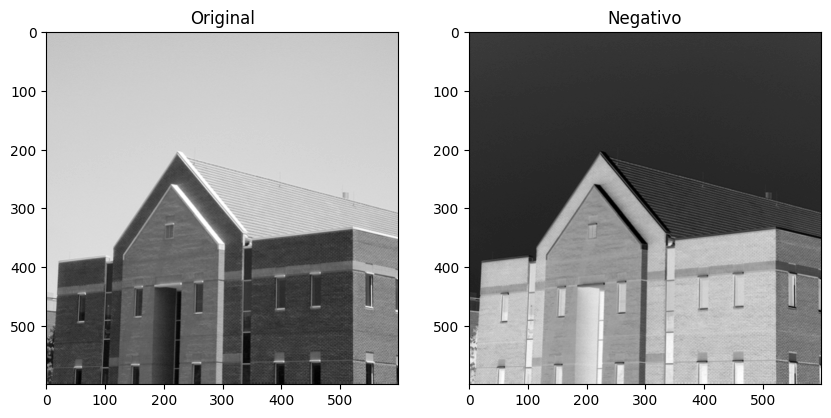

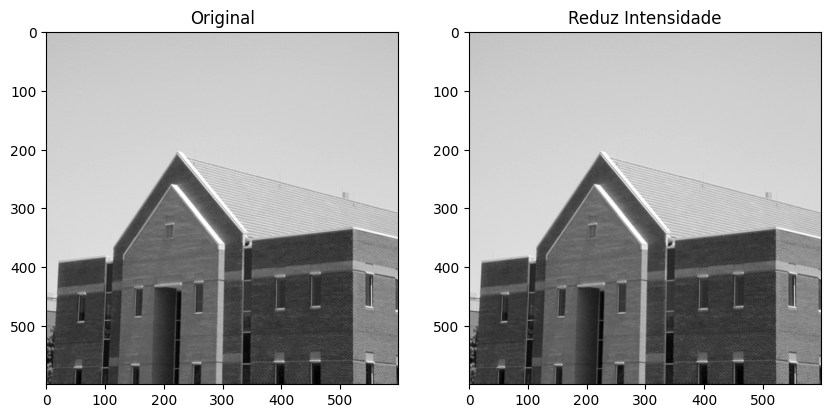

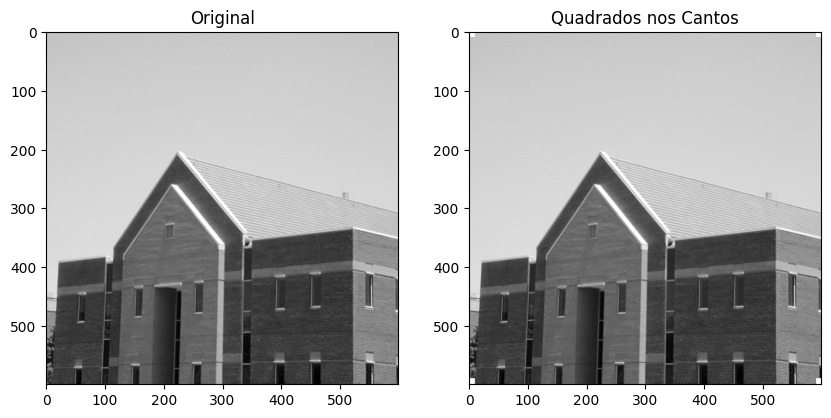

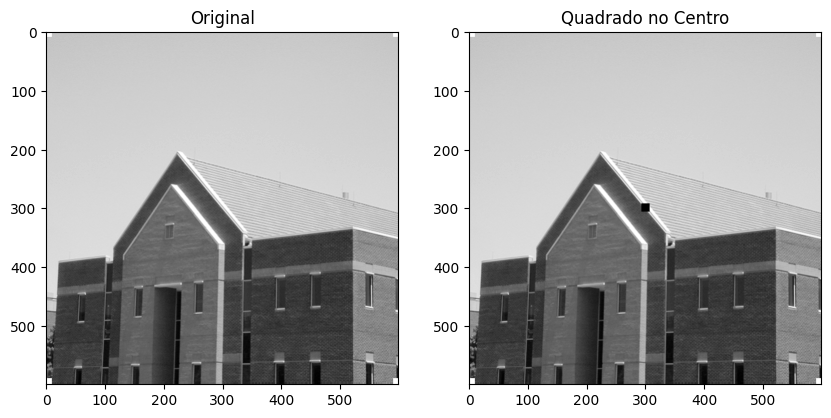

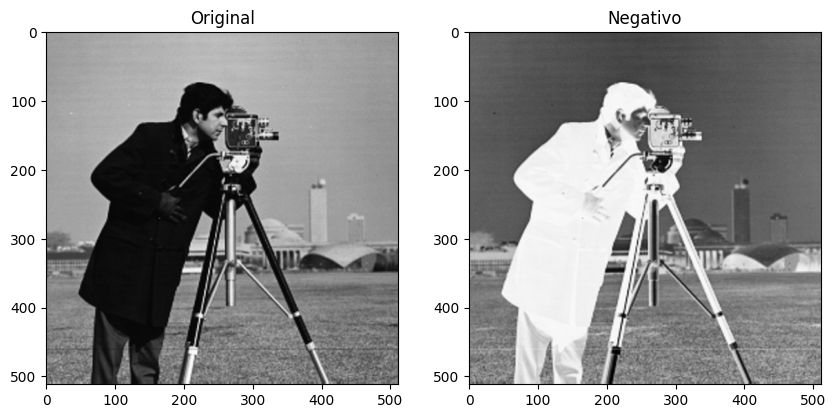

...

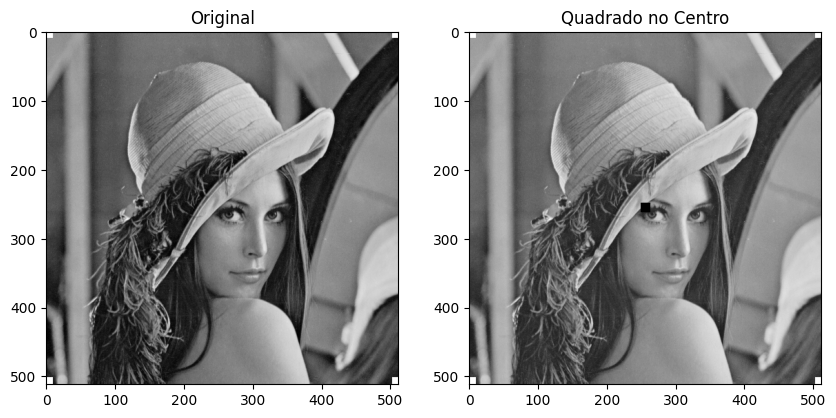

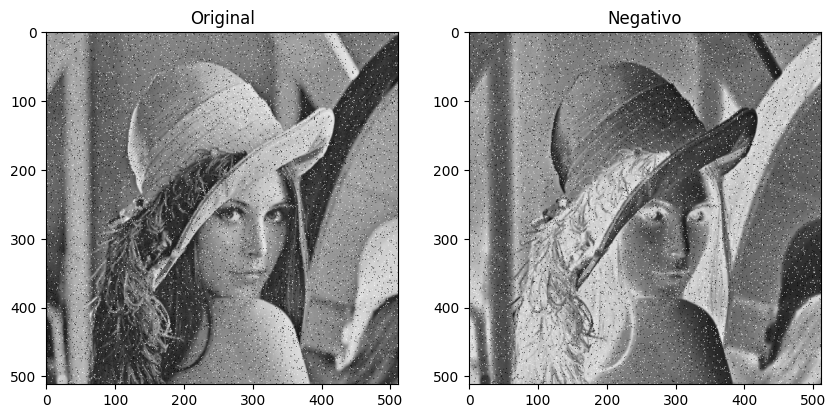

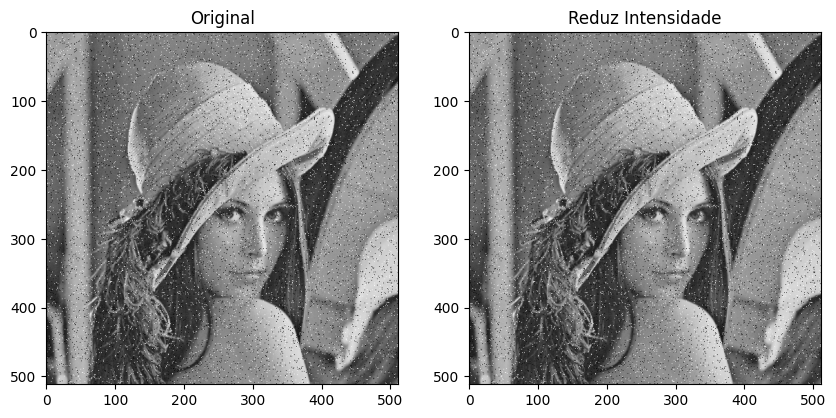

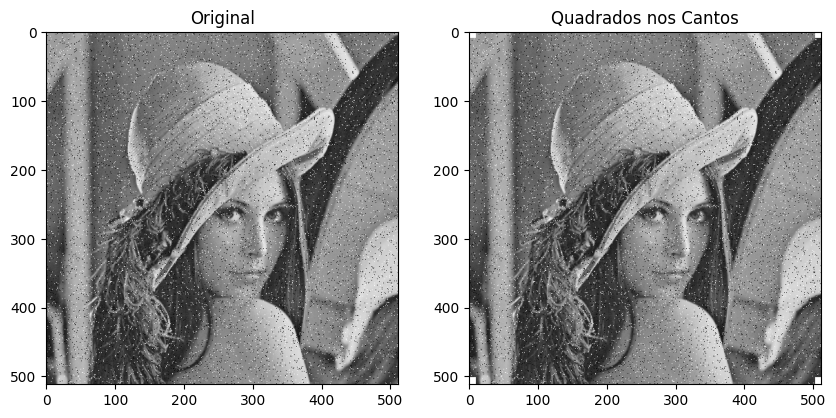

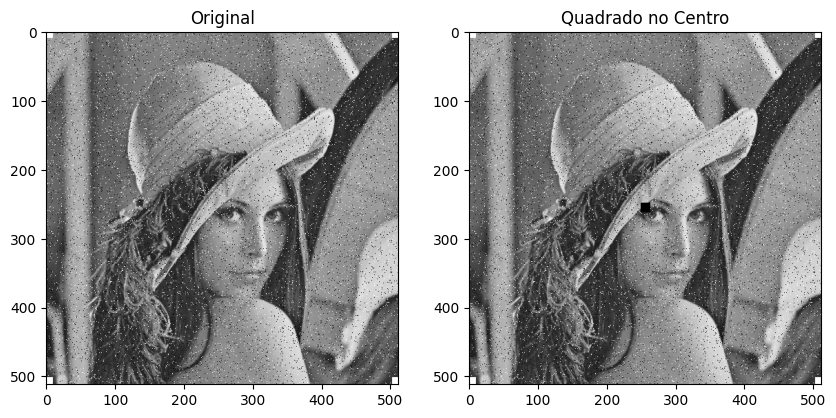

In [ ]:
for index in range(len(images)):
  imagem = images[index]
  imagemArray = np.array(imagem)
  negativo(imagemArray)
  reduz_intensidade(imagemArray)
  adiciona_quadrados(imagemArray)
  adiciona_quadrado_centro(imagemArray)

### 2. Operação por Vizinhança

#### Filtro da Média Numpy

In [ ]:
def media_numpy(imagem, kernel):
  imagem_array = np.array(imagem)
  imagem_tam = imagem_array.shape

  imagem_media = np.zeros((imagem_tam[0], imagem_tam[1]), dtype=np.uint8)
  for x in range(kernel, imagem_tam[0] - kernel):
        for y in range(kernel, imagem_tam[1] - kernel):
            s_xy = imagem_array[x - kernel: x + kernel + 1, y - kernel: y + kernel + 1]

            # get median
            mean = np.mean(s_xy).astype(int)

            # assign mean to output image
            imagem_media[x, y] = mean
  plota(imagem_array, imagem_media, "Filtro da Média Numpy")

#### Filtro da Média Pillow

In [ ]:
def media_pillow(imagem, kernel):
    imagem_array = np.array(imagem)
    imagem.filter(ImageFilter.BoxBlur(kernel))
    imagem_PIL_array = np.array(imagem)
    plota(imagem_array, imagem_PIL_array, "Filtro da Média Pillow")

#### Filtro da Média CV2

In [ ]:
def media_opencv2(imagem, kernel):
    imagem_array = np.array(imagem)
    img_nd = np.array(imagem)
    cv2.blur(img_nd, (kernel, kernel))
    plota(imagem_array, img_nd, "Filtro da Média OpenCV2")

#### Filtro da Média Scipy

In [ ]:
def media_scipy(imagem, kernel):
    imagem_array = np.array(imagem)
    img_nd = np.array(imagem)
    imagem_filtrada = uniform_filter(img_nd, size=kernel)
    plota(imagem_array, imagem_filtrada, "Filtro da Média Scipy")

#### Resultado

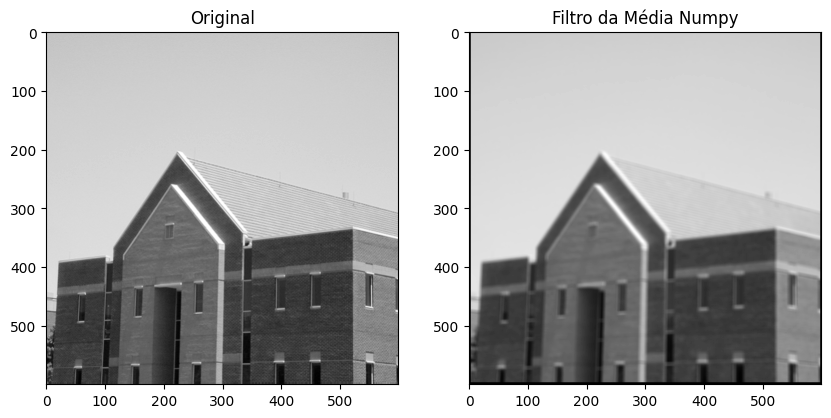

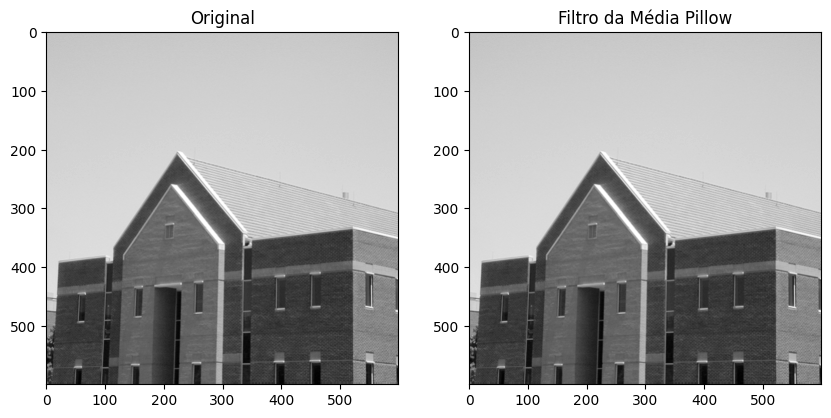

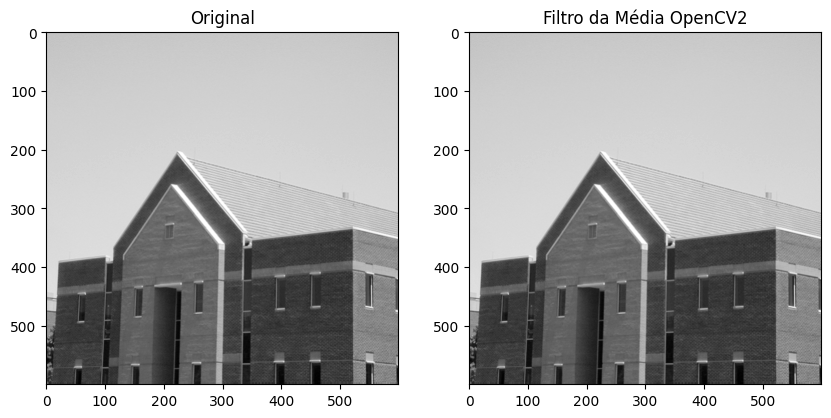

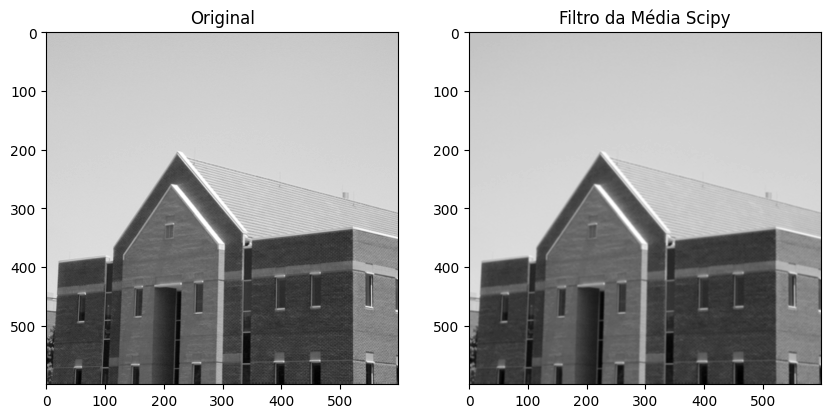

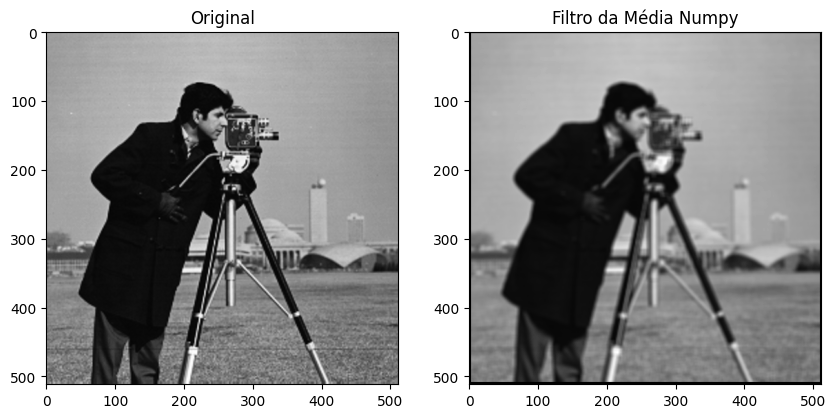

...

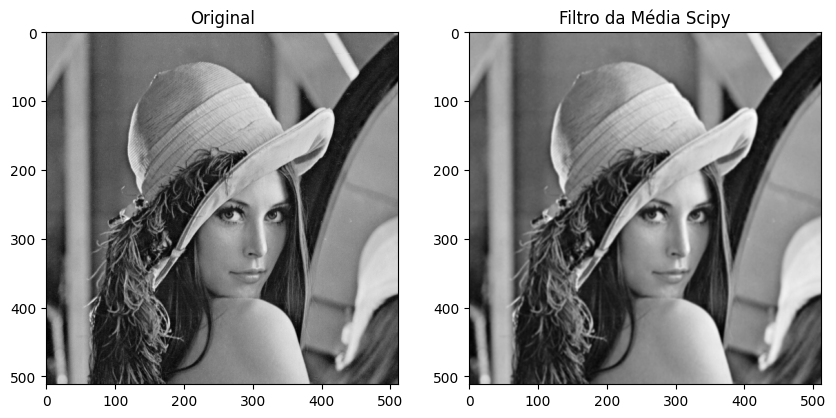

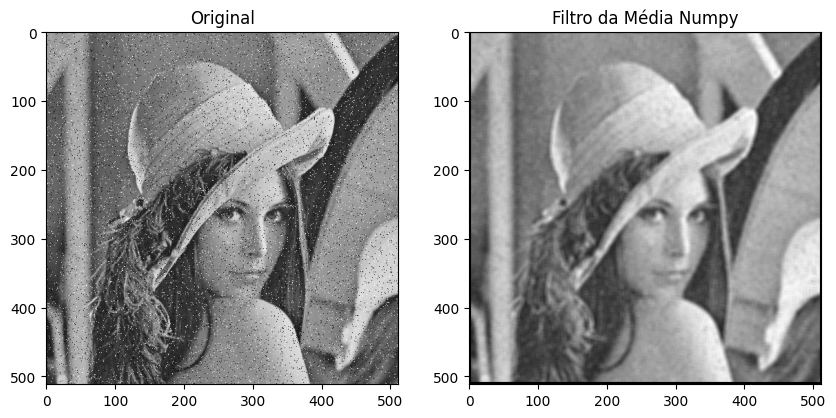

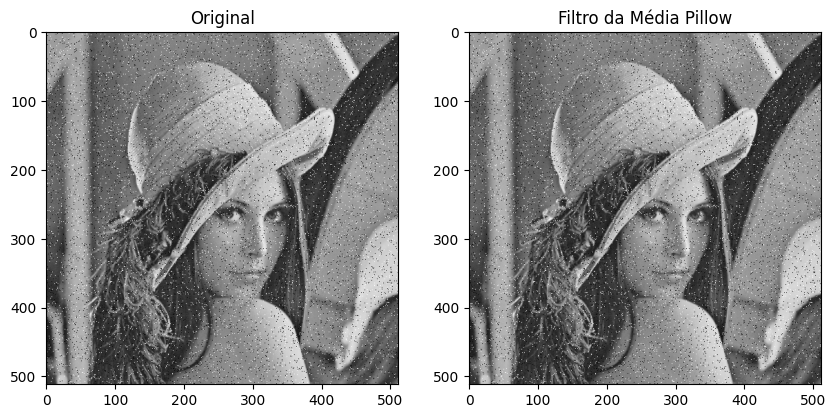

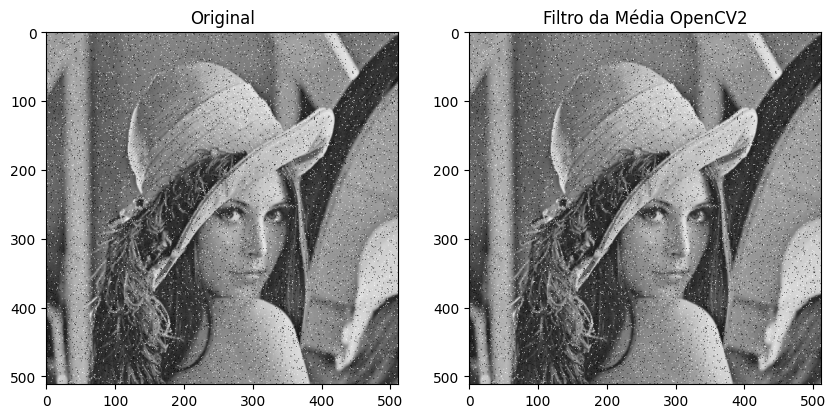

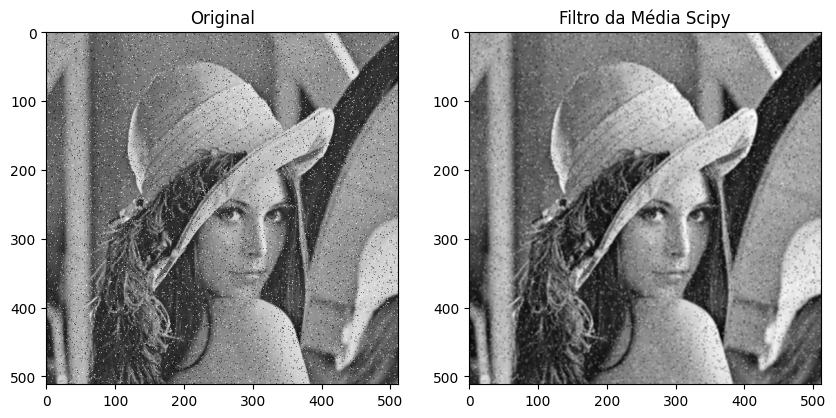

In [ ]:
for index in range(len(images)):
  imagem = images[index]
  kernel = 3
  media_numpy(imagem, kernel)
  media_pillow(imagem, kernel)
  media_opencv2(imagem, kernel)
  media_scipy(imagem, kernel)

#### Filtro da Mediana Numpy

In [ ]:
def mediana_numpy(imagem, kernel):
  imagem_array = np.array(imagem)
  imagem_tam = imagem_array.shape

  imagem_mediana = np.zeros((imagem_tam[0], imagem_tam[1]), dtype=np.uint8)
  for x in range(kernel, imagem_tam[0] - kernel):
        for y in range(kernel, imagem_tam[1] - kernel):
            s_xy = imagem_array[x - kernel: x + kernel + 1, y - kernel: y + kernel + 1]

            median = np.median(s_xy).astype(int)

            imagem_mediana[x, y] = median
  plota(imagem_array, imagem_mediana, "Filtro da Mediana Numpy")

#### Filtro da Mediana Pillow


In [ ]:
def mediana_pillow(imagem, kernel):
    imagem_array = np.array(imagem)
    imagem = imagem.filter(ImageFilter.MedianFilter(kernel))
    imagem_PIL_array = np.array(imagem)
    plota(imagem_array, imagem_PIL_array, "Filtro da Mediana Pillow")

#### Filtro da Mediana CV2


In [ ]:
def mediana_opencv2(imagem, kernel):
    imagem_array = np.array(imagem)
    img_nd = np.array(imagem)
    img_nd = cv2.medianBlur(img_nd, kernel)
    plota(imagem_array, img_nd, "Filtro da Mediana OpenCV2")

#### Filtro da Mediana Scipy

In [ ]:
def mediana_scipy(imagem, kernel):
    imagem_array = np.array(imagem)
    img_nd = np.array(imagem)
    imagem_filtrada = median_filter(img_nd, size=kernel)
    plota(imagem_array, imagem_filtrada, "Filtro da Média Scipy")

#### Resultado

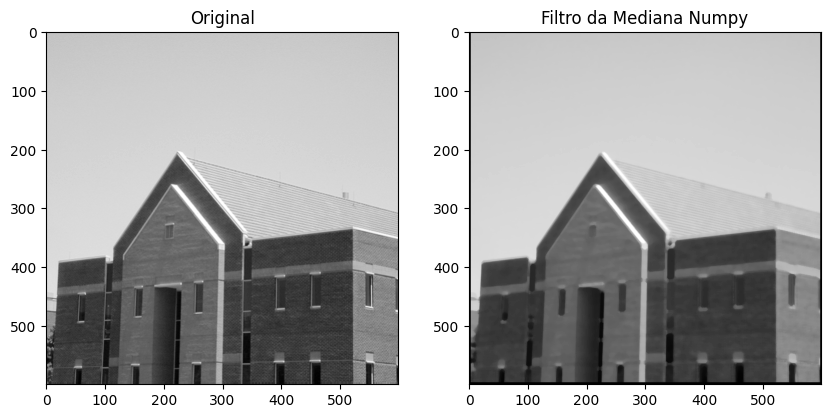

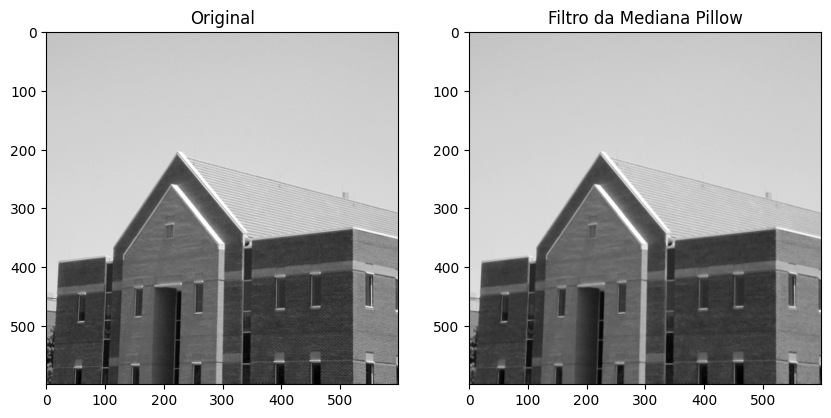

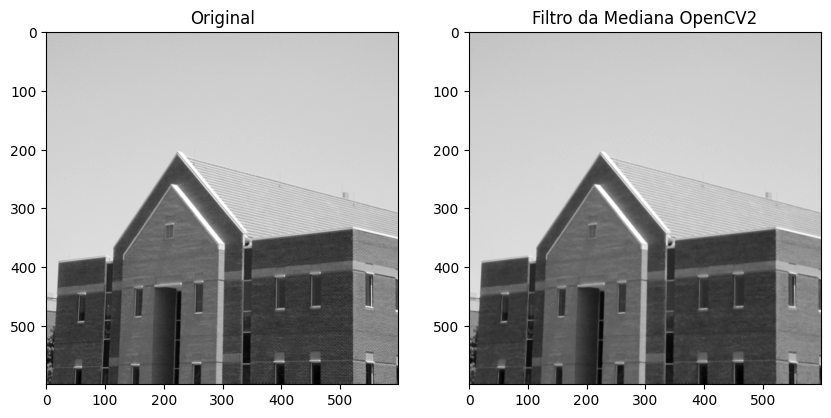

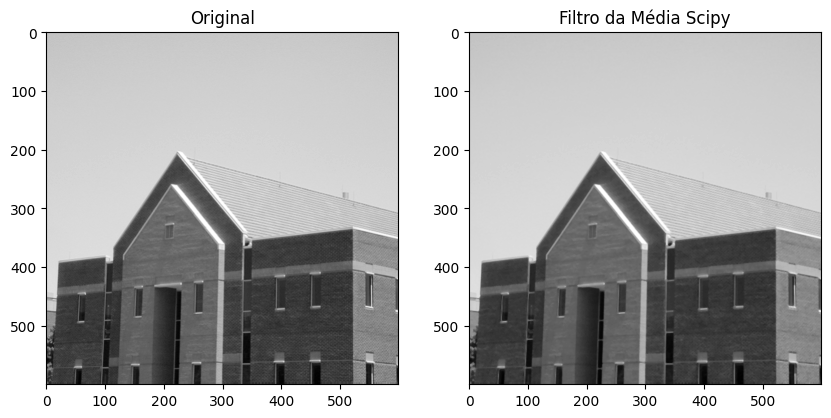

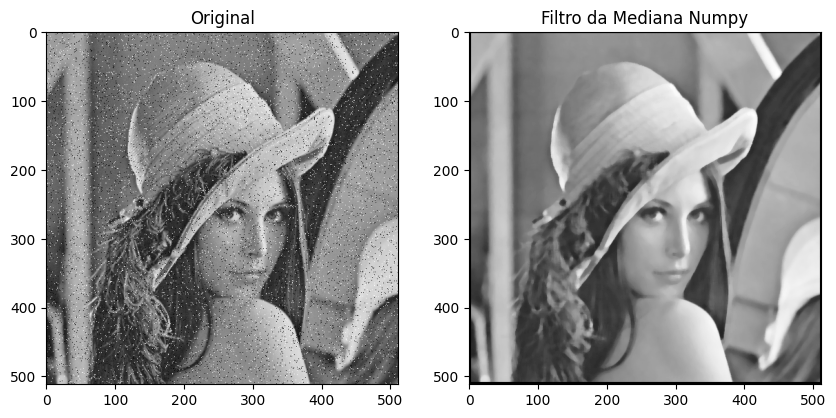

...

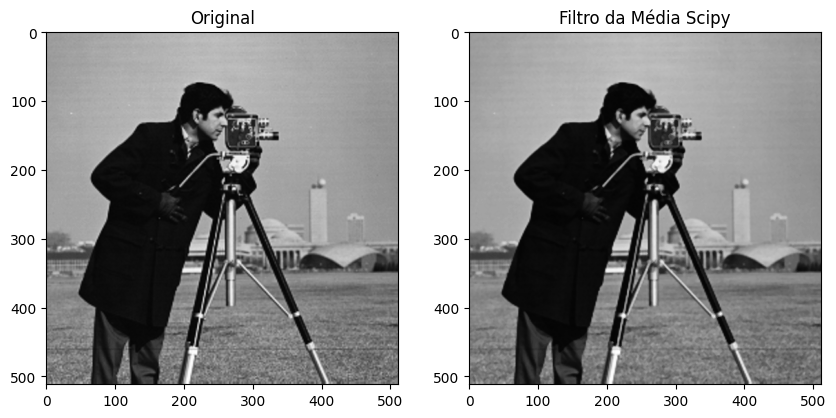

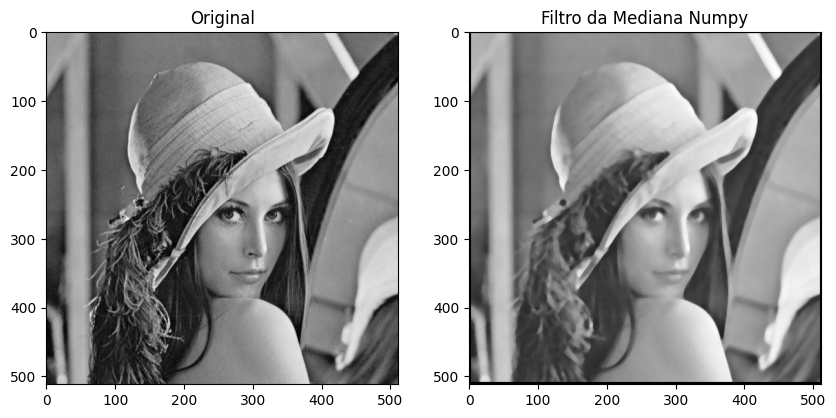

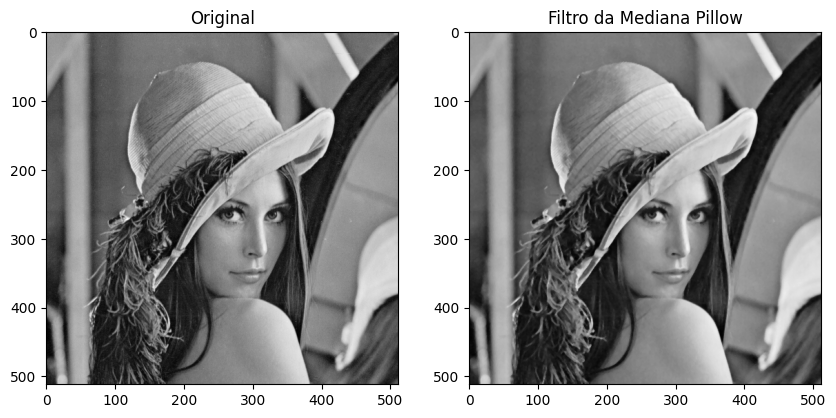

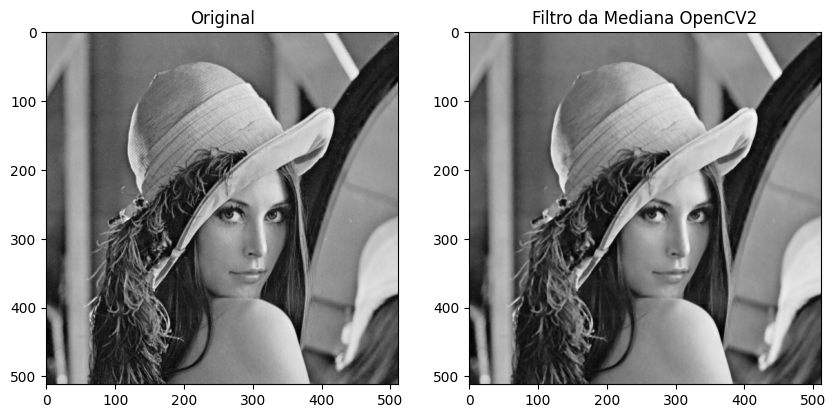

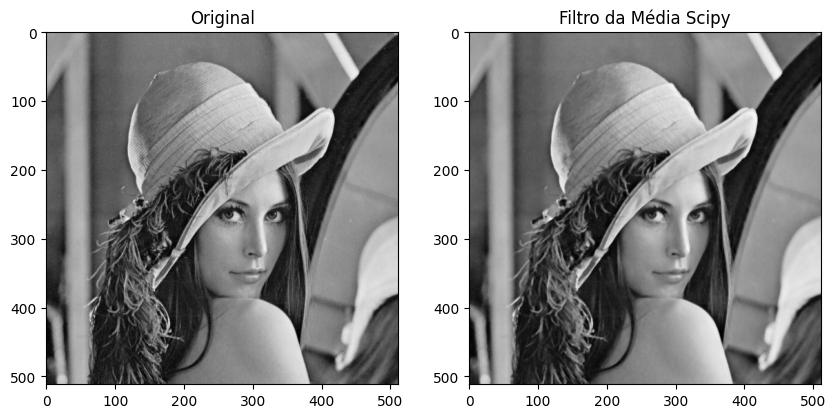

In [ ]:
for index in range(len(images)):
  imagem = images[index]
  kernel = 3
  mediana_numpy(imagem, kernel)
  mediana_pillow(imagem, kernel)
  mediana_opencv2(imagem, kernel)
  mediana_scipy(imagem, kernel)